# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: data: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

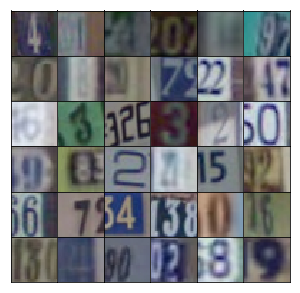

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 512*4*4)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)        
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)        
        
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.1678... Generator Loss: 0.7759
Epoch 1/25... Discriminator Loss: 0.8597... Generator Loss: 0.8285
Epoch 1/25... Discriminator Loss: 0.1591... Generator Loss: 2.4537
Epoch 1/25... Discriminator Loss: 0.1259... Generator Loss: 3.1543
Epoch 1/25... Discriminator Loss: 0.1334... Generator Loss: 2.9490
Epoch 1/25... Discriminator Loss: 0.0719... Generator Loss: 3.2287
Epoch 1/25... Discriminator Loss: 0.0986... Generator Loss: 3.0715
Epoch 1/25... Discriminator Loss: 0.1023... Generator Loss: 3.2624
Epoch 1/25... Discriminator Loss: 0.0791... Generator Loss: 3.2607
Epoch 1/25... Discriminator Loss: 0.1751... Generator Loss: 2.4577


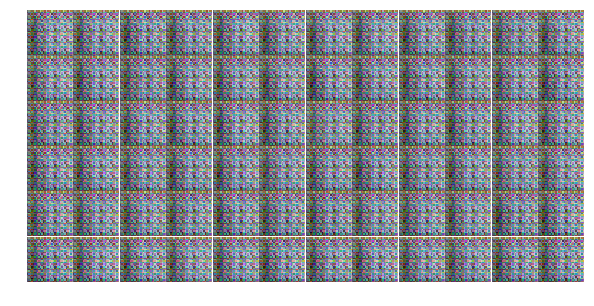

Epoch 1/25... Discriminator Loss: 0.0648... Generator Loss: 4.9891
Epoch 1/25... Discriminator Loss: 0.0615... Generator Loss: 3.4540
Epoch 1/25... Discriminator Loss: 0.0994... Generator Loss: 3.5696
Epoch 1/25... Discriminator Loss: 0.1331... Generator Loss: 3.6040
Epoch 1/25... Discriminator Loss: 0.9721... Generator Loss: 0.9764
Epoch 1/25... Discriminator Loss: 0.8538... Generator Loss: 0.9198
Epoch 1/25... Discriminator Loss: 0.5051... Generator Loss: 2.0705
Epoch 1/25... Discriminator Loss: 0.3371... Generator Loss: 2.4919
Epoch 1/25... Discriminator Loss: 0.5542... Generator Loss: 1.3871
Epoch 1/25... Discriminator Loss: 0.3426... Generator Loss: 1.9282


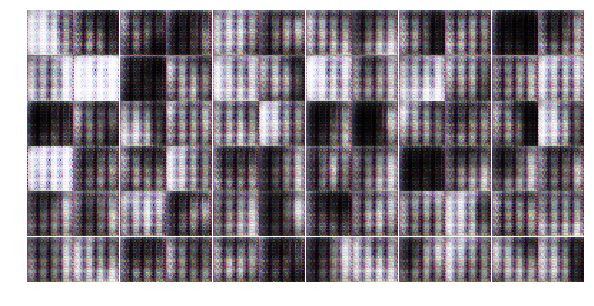

Epoch 1/25... Discriminator Loss: 0.5871... Generator Loss: 1.0973
Epoch 1/25... Discriminator Loss: 0.3224... Generator Loss: 2.3105
Epoch 1/25... Discriminator Loss: 0.8652... Generator Loss: 2.4379
Epoch 1/25... Discriminator Loss: 0.1698... Generator Loss: 2.7385
Epoch 1/25... Discriminator Loss: 0.4389... Generator Loss: 1.2479
Epoch 1/25... Discriminator Loss: 0.7083... Generator Loss: 3.4213
Epoch 1/25... Discriminator Loss: 0.2148... Generator Loss: 2.4193
Epoch 1/25... Discriminator Loss: 0.1916... Generator Loss: 2.5257
Epoch 1/25... Discriminator Loss: 1.5322... Generator Loss: 3.1591
Epoch 1/25... Discriminator Loss: 0.3730... Generator Loss: 1.7931


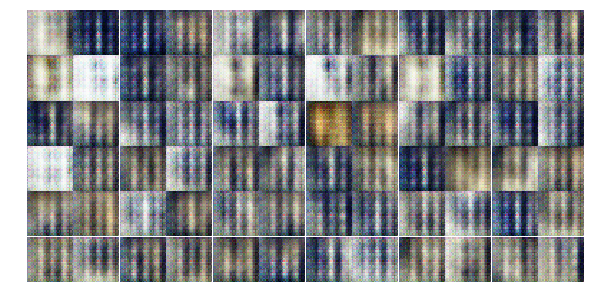

Epoch 1/25... Discriminator Loss: 1.2198... Generator Loss: 0.7699
Epoch 1/25... Discriminator Loss: 0.5949... Generator Loss: 2.7509
Epoch 1/25... Discriminator Loss: 0.4508... Generator Loss: 1.6201
Epoch 1/25... Discriminator Loss: 0.7344... Generator Loss: 1.0786
Epoch 1/25... Discriminator Loss: 1.0617... Generator Loss: 1.4987
Epoch 1/25... Discriminator Loss: 0.9664... Generator Loss: 1.1518
Epoch 1/25... Discriminator Loss: 0.6554... Generator Loss: 1.3206
Epoch 1/25... Discriminator Loss: 0.6594... Generator Loss: 1.6883
Epoch 1/25... Discriminator Loss: 0.6389... Generator Loss: 1.9814
Epoch 1/25... Discriminator Loss: 0.5154... Generator Loss: 1.5874


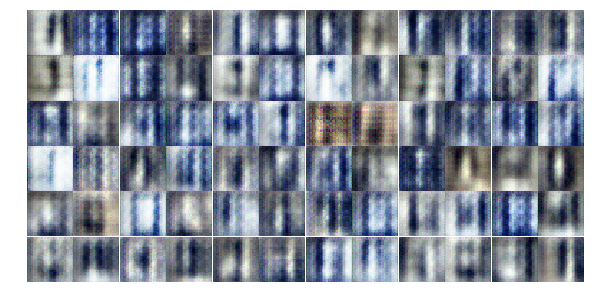

Epoch 1/25... Discriminator Loss: 0.3340... Generator Loss: 2.1838
Epoch 1/25... Discriminator Loss: 0.4130... Generator Loss: 1.7617
Epoch 1/25... Discriminator Loss: 0.6951... Generator Loss: 0.9020
Epoch 1/25... Discriminator Loss: 0.4290... Generator Loss: 2.2382
Epoch 1/25... Discriminator Loss: 0.7653... Generator Loss: 0.8616
Epoch 1/25... Discriminator Loss: 0.4696... Generator Loss: 1.7152
Epoch 1/25... Discriminator Loss: 0.7473... Generator Loss: 1.3341
Epoch 1/25... Discriminator Loss: 0.7542... Generator Loss: 1.6045
Epoch 1/25... Discriminator Loss: 0.9617... Generator Loss: 0.9056
Epoch 1/25... Discriminator Loss: 0.6186... Generator Loss: 1.3784


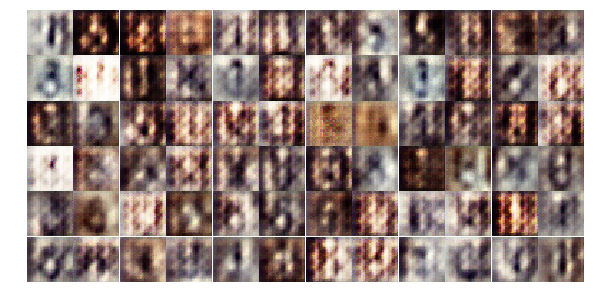

Epoch 1/25... Discriminator Loss: 0.6026... Generator Loss: 1.8440
Epoch 1/25... Discriminator Loss: 0.8058... Generator Loss: 0.9286
Epoch 1/25... Discriminator Loss: 0.5895... Generator Loss: 1.7008
Epoch 1/25... Discriminator Loss: 1.0513... Generator Loss: 0.8646
Epoch 1/25... Discriminator Loss: 0.6515... Generator Loss: 1.1819
Epoch 1/25... Discriminator Loss: 0.4932... Generator Loss: 1.5457
Epoch 1/25... Discriminator Loss: 0.5575... Generator Loss: 1.8085
Epoch 2/25... Discriminator Loss: 0.8734... Generator Loss: 2.2648
Epoch 2/25... Discriminator Loss: 0.7753... Generator Loss: 1.7563
Epoch 2/25... Discriminator Loss: 0.8905... Generator Loss: 1.0760


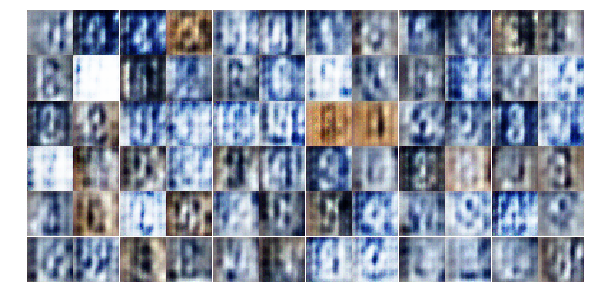

Epoch 2/25... Discriminator Loss: 0.6947... Generator Loss: 1.0765
Epoch 2/25... Discriminator Loss: 0.7140... Generator Loss: 1.4970
Epoch 2/25... Discriminator Loss: 0.9767... Generator Loss: 1.3168
Epoch 2/25... Discriminator Loss: 1.1082... Generator Loss: 1.0295
Epoch 2/25... Discriminator Loss: 1.2642... Generator Loss: 0.7180
Epoch 2/25... Discriminator Loss: 0.6729... Generator Loss: 1.5096
Epoch 2/25... Discriminator Loss: 1.0092... Generator Loss: 0.9813
Epoch 2/25... Discriminator Loss: 1.4829... Generator Loss: 0.4940
Epoch 2/25... Discriminator Loss: 0.9722... Generator Loss: 1.3635
Epoch 2/25... Discriminator Loss: 0.9259... Generator Loss: 1.1088


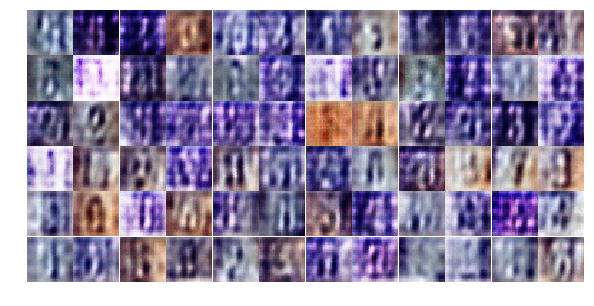

Epoch 2/25... Discriminator Loss: 1.3857... Generator Loss: 1.2923
Epoch 2/25... Discriminator Loss: 0.9031... Generator Loss: 1.6203
Epoch 2/25... Discriminator Loss: 1.3924... Generator Loss: 0.6507
Epoch 2/25... Discriminator Loss: 1.1525... Generator Loss: 0.8454
Epoch 2/25... Discriminator Loss: 1.1756... Generator Loss: 1.1704
Epoch 2/25... Discriminator Loss: 1.0159... Generator Loss: 0.9127
Epoch 2/25... Discriminator Loss: 1.0570... Generator Loss: 0.9829
Epoch 2/25... Discriminator Loss: 0.8097... Generator Loss: 1.2048
Epoch 2/25... Discriminator Loss: 0.7016... Generator Loss: 1.3241
Epoch 2/25... Discriminator Loss: 1.3272... Generator Loss: 0.4791


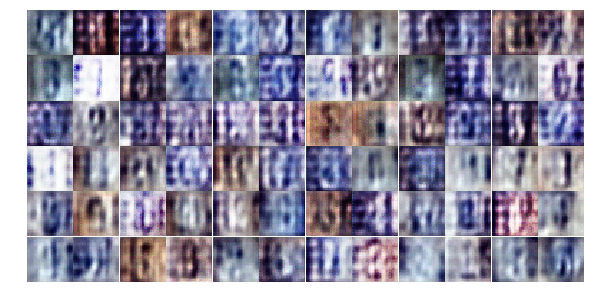

Epoch 2/25... Discriminator Loss: 1.1985... Generator Loss: 0.6257
Epoch 2/25... Discriminator Loss: 1.1891... Generator Loss: 1.0403
Epoch 2/25... Discriminator Loss: 1.0714... Generator Loss: 1.2540
Epoch 2/25... Discriminator Loss: 0.7833... Generator Loss: 1.6048
Epoch 2/25... Discriminator Loss: 1.1540... Generator Loss: 0.8353
Epoch 2/25... Discriminator Loss: 1.6805... Generator Loss: 0.4404
Epoch 2/25... Discriminator Loss: 1.1395... Generator Loss: 0.7466
Epoch 2/25... Discriminator Loss: 1.0139... Generator Loss: 0.7959
Epoch 2/25... Discriminator Loss: 1.4460... Generator Loss: 0.5036
Epoch 2/25... Discriminator Loss: 1.2998... Generator Loss: 0.8030


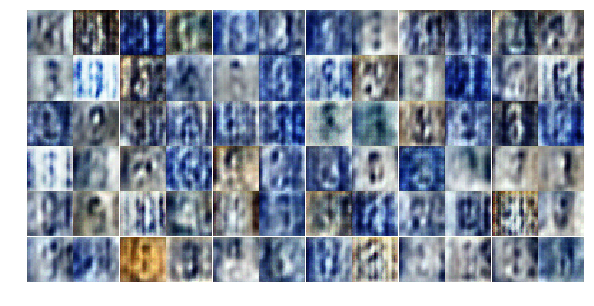

Epoch 2/25... Discriminator Loss: 0.9536... Generator Loss: 1.2311
Epoch 2/25... Discriminator Loss: 1.1828... Generator Loss: 1.2577
Epoch 2/25... Discriminator Loss: 1.5730... Generator Loss: 0.5011
Epoch 2/25... Discriminator Loss: 1.1804... Generator Loss: 0.6628
Epoch 2/25... Discriminator Loss: 0.8435... Generator Loss: 1.0852
Epoch 2/25... Discriminator Loss: 1.2191... Generator Loss: 0.9340
Epoch 2/25... Discriminator Loss: 1.1331... Generator Loss: 0.8848
Epoch 2/25... Discriminator Loss: 1.0439... Generator Loss: 1.0390
Epoch 2/25... Discriminator Loss: 1.1285... Generator Loss: 1.0395
Epoch 2/25... Discriminator Loss: 1.0927... Generator Loss: 1.3085


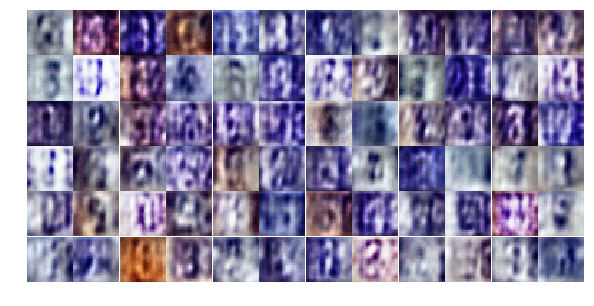

Epoch 2/25... Discriminator Loss: 0.9227... Generator Loss: 1.5563
Epoch 2/25... Discriminator Loss: 1.0741... Generator Loss: 1.4453
Epoch 2/25... Discriminator Loss: 0.9588... Generator Loss: 0.9125
Epoch 2/25... Discriminator Loss: 1.0938... Generator Loss: 0.8183
Epoch 2/25... Discriminator Loss: 1.0400... Generator Loss: 0.8987
Epoch 2/25... Discriminator Loss: 1.2134... Generator Loss: 1.0210
Epoch 2/25... Discriminator Loss: 1.0896... Generator Loss: 1.4962
Epoch 2/25... Discriminator Loss: 0.9108... Generator Loss: 1.1487
Epoch 2/25... Discriminator Loss: 0.6023... Generator Loss: 1.6762
Epoch 2/25... Discriminator Loss: 1.0116... Generator Loss: 1.3478


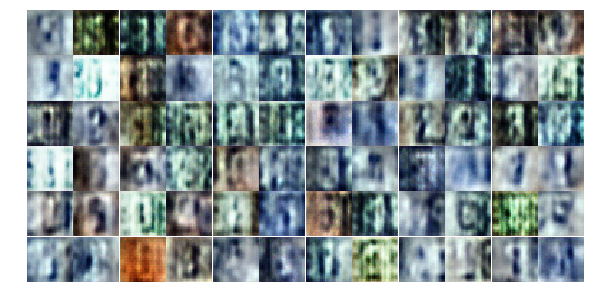

Epoch 2/25... Discriminator Loss: 0.9639... Generator Loss: 1.3798
Epoch 2/25... Discriminator Loss: 1.0189... Generator Loss: 0.9448
Epoch 2/25... Discriminator Loss: 1.3057... Generator Loss: 0.6233
Epoch 2/25... Discriminator Loss: 1.0507... Generator Loss: 0.9855
Epoch 3/25... Discriminator Loss: 0.8522... Generator Loss: 1.8403
Epoch 3/25... Discriminator Loss: 1.0863... Generator Loss: 0.8692
Epoch 3/25... Discriminator Loss: 1.0485... Generator Loss: 1.0959
Epoch 3/25... Discriminator Loss: 0.9494... Generator Loss: 0.9858
Epoch 3/25... Discriminator Loss: 1.1128... Generator Loss: 0.9189
Epoch 3/25... Discriminator Loss: 0.9375... Generator Loss: 1.1932


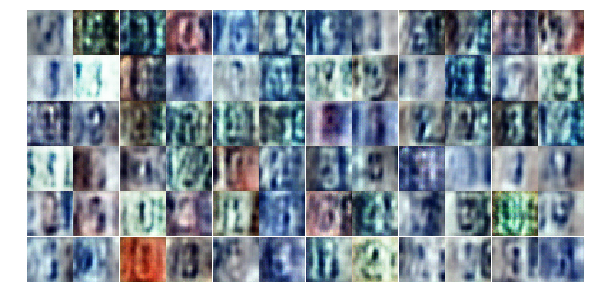

Epoch 3/25... Discriminator Loss: 0.5705... Generator Loss: 1.2553
Epoch 3/25... Discriminator Loss: 0.9024... Generator Loss: 1.4250
Epoch 3/25... Discriminator Loss: 0.8826... Generator Loss: 0.9481
Epoch 3/25... Discriminator Loss: 0.9682... Generator Loss: 1.2302
Epoch 3/25... Discriminator Loss: 0.9997... Generator Loss: 0.9835
Epoch 3/25... Discriminator Loss: 0.9321... Generator Loss: 0.9105
Epoch 3/25... Discriminator Loss: 0.8056... Generator Loss: 1.1378
Epoch 3/25... Discriminator Loss: 0.9818... Generator Loss: 0.9167
Epoch 3/25... Discriminator Loss: 1.0480... Generator Loss: 0.8496
Epoch 3/25... Discriminator Loss: 0.9458... Generator Loss: 0.8142


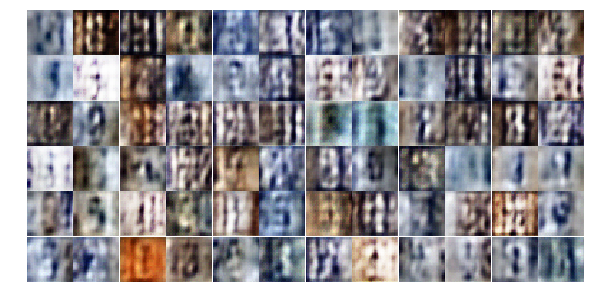

Epoch 3/25... Discriminator Loss: 0.9325... Generator Loss: 1.8561
Epoch 3/25... Discriminator Loss: 0.6083... Generator Loss: 1.5448
Epoch 3/25... Discriminator Loss: 0.6992... Generator Loss: 1.1095
Epoch 3/25... Discriminator Loss: 0.7182... Generator Loss: 1.6099
Epoch 3/25... Discriminator Loss: 0.9978... Generator Loss: 0.8111
Epoch 3/25... Discriminator Loss: 0.5585... Generator Loss: 2.1753
Epoch 3/25... Discriminator Loss: 1.2678... Generator Loss: 0.4577
Epoch 3/25... Discriminator Loss: 0.8169... Generator Loss: 1.0460
Epoch 3/25... Discriminator Loss: 0.6444... Generator Loss: 1.8737
Epoch 3/25... Discriminator Loss: 0.6737... Generator Loss: 1.0832


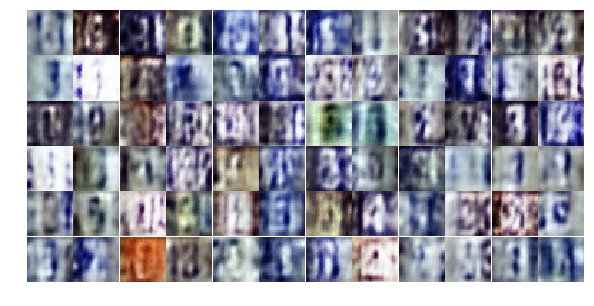

Epoch 3/25... Discriminator Loss: 1.1320... Generator Loss: 1.3318
Epoch 3/25... Discriminator Loss: 0.5981... Generator Loss: 1.3037
Epoch 3/25... Discriminator Loss: 0.9071... Generator Loss: 0.7439
Epoch 3/25... Discriminator Loss: 0.7161... Generator Loss: 0.9867
Epoch 3/25... Discriminator Loss: 1.0636... Generator Loss: 0.8571
Epoch 3/25... Discriminator Loss: 0.6570... Generator Loss: 1.3361
Epoch 3/25... Discriminator Loss: 0.5169... Generator Loss: 1.3082
Epoch 3/25... Discriminator Loss: 0.7449... Generator Loss: 1.2795
Epoch 3/25... Discriminator Loss: 1.0324... Generator Loss: 0.9545
Epoch 3/25... Discriminator Loss: 0.9755... Generator Loss: 1.4710


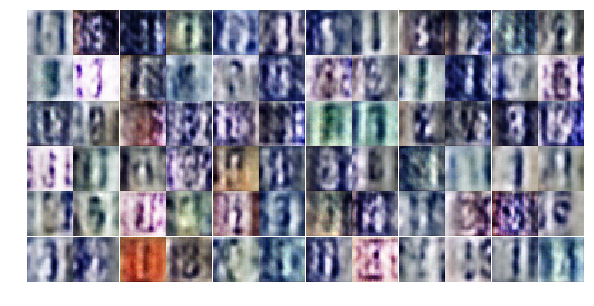

Epoch 3/25... Discriminator Loss: 0.5985... Generator Loss: 1.9220
Epoch 3/25... Discriminator Loss: 0.4881... Generator Loss: 2.4692
Epoch 3/25... Discriminator Loss: 0.8222... Generator Loss: 0.9449
Epoch 3/25... Discriminator Loss: 0.8191... Generator Loss: 0.8282
Epoch 3/25... Discriminator Loss: 0.7786... Generator Loss: 1.8827
Epoch 3/25... Discriminator Loss: 1.1037... Generator Loss: 0.5088
Epoch 3/25... Discriminator Loss: 0.5637... Generator Loss: 1.5515
Epoch 3/25... Discriminator Loss: 0.6156... Generator Loss: 1.3705
Epoch 3/25... Discriminator Loss: 0.6564... Generator Loss: 2.1250
Epoch 3/25... Discriminator Loss: 0.8900... Generator Loss: 1.3194


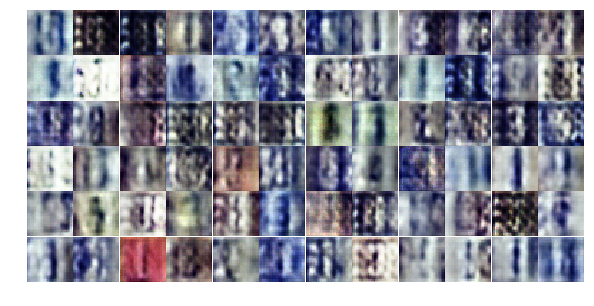

Epoch 3/25... Discriminator Loss: 0.6795... Generator Loss: 1.3027
Epoch 3/25... Discriminator Loss: 0.8277... Generator Loss: 1.9982
Epoch 3/25... Discriminator Loss: 0.4418... Generator Loss: 1.4702
Epoch 3/25... Discriminator Loss: 0.5767... Generator Loss: 2.0174
Epoch 3/25... Discriminator Loss: 0.9014... Generator Loss: 2.2948
Epoch 3/25... Discriminator Loss: 0.4871... Generator Loss: 2.0958
Epoch 3/25... Discriminator Loss: 0.5517... Generator Loss: 2.5271
Epoch 3/25... Discriminator Loss: 0.4420... Generator Loss: 1.6908
Epoch 3/25... Discriminator Loss: 0.5184... Generator Loss: 1.6468
Epoch 3/25... Discriminator Loss: 0.4333... Generator Loss: 1.7604


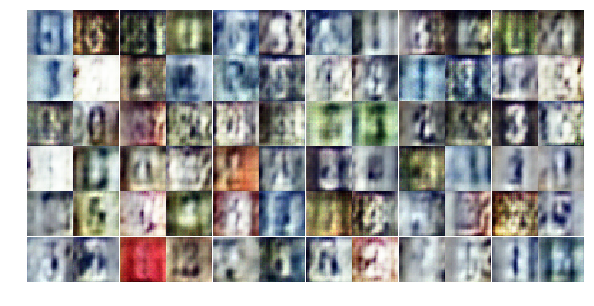

Epoch 3/25... Discriminator Loss: 1.1414... Generator Loss: 0.5825
Epoch 4/25... Discriminator Loss: 0.6454... Generator Loss: 1.1862
Epoch 4/25... Discriminator Loss: 0.4168... Generator Loss: 1.8626
Epoch 4/25... Discriminator Loss: 1.0395... Generator Loss: 0.6557
Epoch 4/25... Discriminator Loss: 0.5821... Generator Loss: 1.2266
Epoch 4/25... Discriminator Loss: 0.5717... Generator Loss: 1.3704
Epoch 4/25... Discriminator Loss: 0.5356... Generator Loss: 3.0117
Epoch 4/25... Discriminator Loss: 0.4382... Generator Loss: 2.4953
Epoch 4/25... Discriminator Loss: 0.3023... Generator Loss: 2.0933
Epoch 4/25... Discriminator Loss: 0.4059... Generator Loss: 1.7304


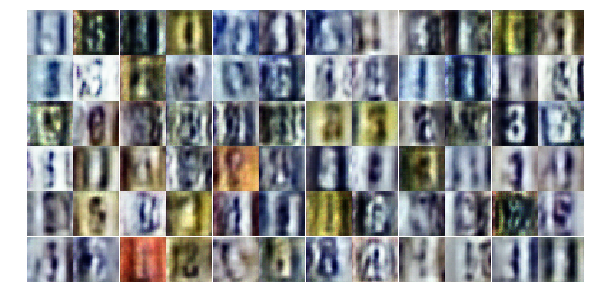

Epoch 4/25... Discriminator Loss: 0.2799... Generator Loss: 1.9444
Epoch 4/25... Discriminator Loss: 0.3922... Generator Loss: 1.6416
Epoch 4/25... Discriminator Loss: 0.9433... Generator Loss: 0.8641
Epoch 4/25... Discriminator Loss: 0.4437... Generator Loss: 1.8715
Epoch 4/25... Discriminator Loss: 0.5932... Generator Loss: 1.3548
Epoch 4/25... Discriminator Loss: 0.6825... Generator Loss: 1.0657
Epoch 4/25... Discriminator Loss: 0.3679... Generator Loss: 2.0747
Epoch 4/25... Discriminator Loss: 0.5642... Generator Loss: 1.1877
Epoch 4/25... Discriminator Loss: 1.6540... Generator Loss: 5.1118
Epoch 4/25... Discriminator Loss: 0.8575... Generator Loss: 2.8729


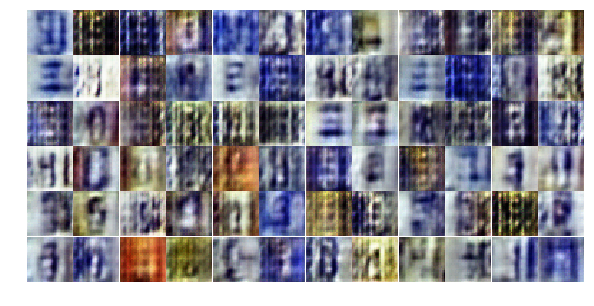

Epoch 4/25... Discriminator Loss: 0.2679... Generator Loss: 2.2806
Epoch 4/25... Discriminator Loss: 0.3201... Generator Loss: 2.4163
Epoch 4/25... Discriminator Loss: 0.3970... Generator Loss: 1.8397
Epoch 4/25... Discriminator Loss: 0.4682... Generator Loss: 2.1211
Epoch 4/25... Discriminator Loss: 0.7165... Generator Loss: 0.9645
Epoch 4/25... Discriminator Loss: 0.6539... Generator Loss: 2.4709
Epoch 4/25... Discriminator Loss: 1.6595... Generator Loss: 0.4239
Epoch 4/25... Discriminator Loss: 1.0862... Generator Loss: 0.5945
Epoch 4/25... Discriminator Loss: 0.3087... Generator Loss: 2.2358
Epoch 4/25... Discriminator Loss: 0.9757... Generator Loss: 3.4126


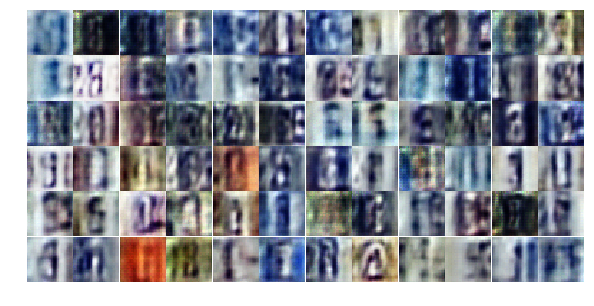

Epoch 4/25... Discriminator Loss: 0.6680... Generator Loss: 1.2095
Epoch 4/25... Discriminator Loss: 0.5199... Generator Loss: 1.4588
Epoch 4/25... Discriminator Loss: 0.4325... Generator Loss: 1.8925
Epoch 4/25... Discriminator Loss: 0.5776... Generator Loss: 1.4769
Epoch 4/25... Discriminator Loss: 0.4447... Generator Loss: 1.6890
Epoch 4/25... Discriminator Loss: 0.2983... Generator Loss: 2.0784
Epoch 4/25... Discriminator Loss: 0.5568... Generator Loss: 1.8665
Epoch 4/25... Discriminator Loss: 0.6311... Generator Loss: 1.0673
Epoch 4/25... Discriminator Loss: 0.7549... Generator Loss: 1.1184
Epoch 4/25... Discriminator Loss: 0.7393... Generator Loss: 2.2629


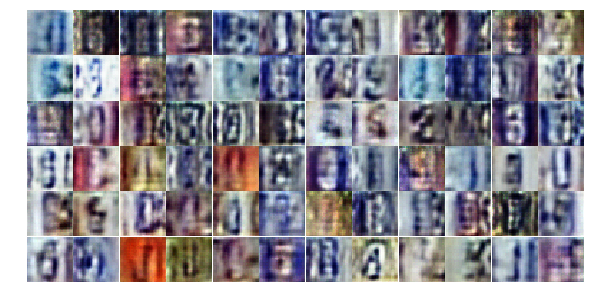

Epoch 4/25... Discriminator Loss: 0.7725... Generator Loss: 1.2715
Epoch 4/25... Discriminator Loss: 0.5034... Generator Loss: 1.4605
Epoch 4/25... Discriminator Loss: 0.8339... Generator Loss: 1.0556
Epoch 4/25... Discriminator Loss: 0.4211... Generator Loss: 2.1853
Epoch 4/25... Discriminator Loss: 0.5006... Generator Loss: 1.7207
Epoch 4/25... Discriminator Loss: 0.9257... Generator Loss: 0.7414
Epoch 4/25... Discriminator Loss: 0.6633... Generator Loss: 2.5926
Epoch 4/25... Discriminator Loss: 0.6814... Generator Loss: 1.2490
Epoch 4/25... Discriminator Loss: 0.6981... Generator Loss: 1.1951
Epoch 4/25... Discriminator Loss: 0.8749... Generator Loss: 1.7193


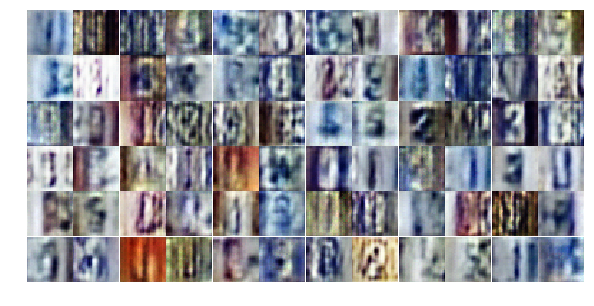

Epoch 4/25... Discriminator Loss: 0.4046... Generator Loss: 1.9391
Epoch 4/25... Discriminator Loss: 0.6239... Generator Loss: 1.4232
Epoch 4/25... Discriminator Loss: 0.5458... Generator Loss: 1.8893
Epoch 4/25... Discriminator Loss: 0.4482... Generator Loss: 1.9098
Epoch 4/25... Discriminator Loss: 0.5590... Generator Loss: 1.4178
Epoch 4/25... Discriminator Loss: 0.6872... Generator Loss: 1.8278
Epoch 4/25... Discriminator Loss: 0.8291... Generator Loss: 0.7475
Epoch 4/25... Discriminator Loss: 0.5693... Generator Loss: 1.2028
Epoch 4/25... Discriminator Loss: 0.4577... Generator Loss: 2.0089
Epoch 5/25... Discriminator Loss: 0.7600... Generator Loss: 0.8783


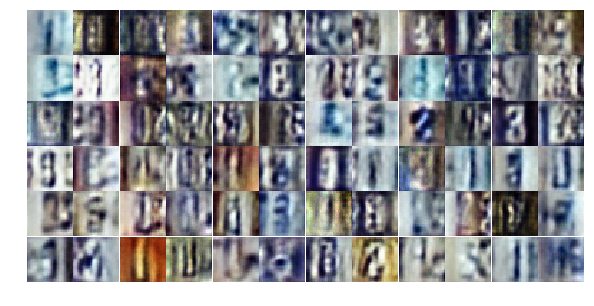

Epoch 5/25... Discriminator Loss: 0.7447... Generator Loss: 1.0367
Epoch 5/25... Discriminator Loss: 0.8586... Generator Loss: 0.7685
Epoch 5/25... Discriminator Loss: 0.5206... Generator Loss: 1.4687
Epoch 5/25... Discriminator Loss: 0.5076... Generator Loss: 1.1869
Epoch 5/25... Discriminator Loss: 0.2709... Generator Loss: 2.5072
Epoch 5/25... Discriminator Loss: 0.6108... Generator Loss: 1.1549
Epoch 5/25... Discriminator Loss: 0.4549... Generator Loss: 1.7069
Epoch 5/25... Discriminator Loss: 0.4544... Generator Loss: 2.1181
Epoch 5/25... Discriminator Loss: 0.6656... Generator Loss: 1.3734
Epoch 5/25... Discriminator Loss: 0.8720... Generator Loss: 0.7855


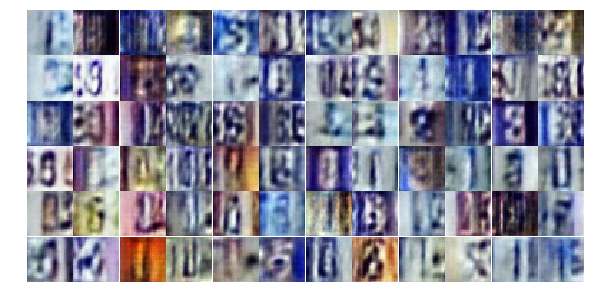

Epoch 5/25... Discriminator Loss: 0.7413... Generator Loss: 0.8966
Epoch 5/25... Discriminator Loss: 0.6006... Generator Loss: 1.1722
Epoch 5/25... Discriminator Loss: 0.5090... Generator Loss: 1.5550
Epoch 5/25... Discriminator Loss: 0.6135... Generator Loss: 1.6996
Epoch 5/25... Discriminator Loss: 0.5272... Generator Loss: 2.0177
Epoch 5/25... Discriminator Loss: 1.2549... Generator Loss: 0.7087
Epoch 5/25... Discriminator Loss: 0.5538... Generator Loss: 2.0107
Epoch 5/25... Discriminator Loss: 0.5207... Generator Loss: 1.4901
Epoch 5/25... Discriminator Loss: 0.4564... Generator Loss: 1.7768
Epoch 5/25... Discriminator Loss: 0.3502... Generator Loss: 1.9444


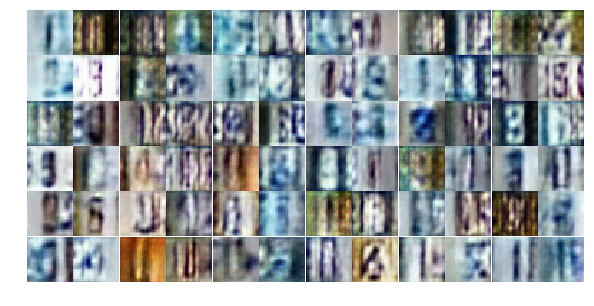

Epoch 5/25... Discriminator Loss: 0.6222... Generator Loss: 1.0148
Epoch 5/25... Discriminator Loss: 0.8429... Generator Loss: 0.7701
Epoch 5/25... Discriminator Loss: 0.4515... Generator Loss: 1.6277
Epoch 5/25... Discriminator Loss: 0.5201... Generator Loss: 1.3663
Epoch 5/25... Discriminator Loss: 0.6337... Generator Loss: 1.0113
Epoch 5/25... Discriminator Loss: 0.4330... Generator Loss: 1.5677
Epoch 5/25... Discriminator Loss: 0.8444... Generator Loss: 0.7238
Epoch 5/25... Discriminator Loss: 0.5113... Generator Loss: 1.3499
Epoch 5/25... Discriminator Loss: 2.2532... Generator Loss: 0.2995
Epoch 5/25... Discriminator Loss: 0.6491... Generator Loss: 1.2204


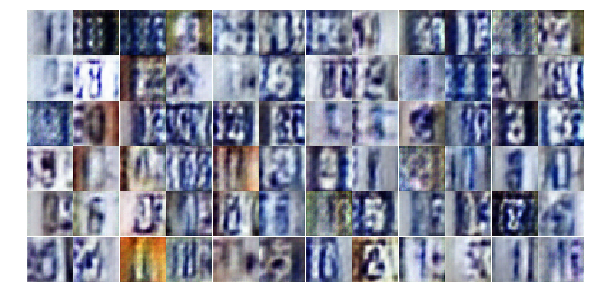

Epoch 5/25... Discriminator Loss: 0.7553... Generator Loss: 1.6058
Epoch 5/25... Discriminator Loss: 0.4562... Generator Loss: 1.5413
Epoch 5/25... Discriminator Loss: 0.6071... Generator Loss: 1.3377
Epoch 5/25... Discriminator Loss: 0.4634... Generator Loss: 1.3103
Epoch 5/25... Discriminator Loss: 0.7034... Generator Loss: 2.7370
Epoch 5/25... Discriminator Loss: 0.4640... Generator Loss: 1.7502
Epoch 5/25... Discriminator Loss: 0.8541... Generator Loss: 0.7329
Epoch 5/25... Discriminator Loss: 0.4306... Generator Loss: 1.6147
Epoch 5/25... Discriminator Loss: 0.5365... Generator Loss: 1.3648
Epoch 5/25... Discriminator Loss: 1.0344... Generator Loss: 0.6145


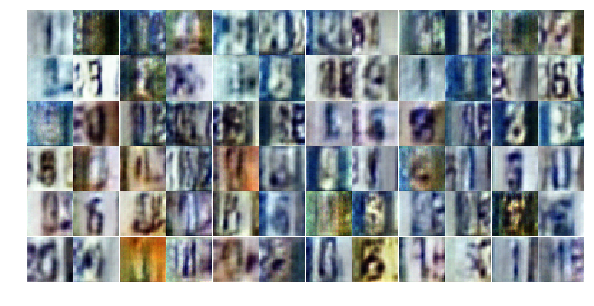

Epoch 5/25... Discriminator Loss: 0.4795... Generator Loss: 1.4105
Epoch 5/25... Discriminator Loss: 0.5931... Generator Loss: 1.0385
Epoch 5/25... Discriminator Loss: 1.2433... Generator Loss: 0.4689
Epoch 5/25... Discriminator Loss: 0.7640... Generator Loss: 1.1105
Epoch 5/25... Discriminator Loss: 0.6964... Generator Loss: 1.2496
Epoch 5/25... Discriminator Loss: 1.0075... Generator Loss: 1.7581
Epoch 5/25... Discriminator Loss: 0.7230... Generator Loss: 0.9747
Epoch 5/25... Discriminator Loss: 0.5043... Generator Loss: 1.8023
Epoch 5/25... Discriminator Loss: 0.8598... Generator Loss: 1.1604
Epoch 5/25... Discriminator Loss: 0.4639... Generator Loss: 1.6254


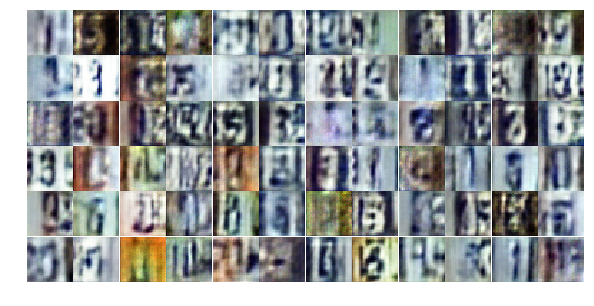

Epoch 5/25... Discriminator Loss: 0.4349... Generator Loss: 1.6363
Epoch 5/25... Discriminator Loss: 0.6933... Generator Loss: 0.9947
Epoch 5/25... Discriminator Loss: 1.3733... Generator Loss: 2.8873
Epoch 5/25... Discriminator Loss: 0.8928... Generator Loss: 0.7301
Epoch 5/25... Discriminator Loss: 0.6323... Generator Loss: 1.1635
Epoch 5/25... Discriminator Loss: 0.9112... Generator Loss: 0.7370
Epoch 6/25... Discriminator Loss: 0.7505... Generator Loss: 0.9912
Epoch 6/25... Discriminator Loss: 0.4872... Generator Loss: 1.4007
Epoch 6/25... Discriminator Loss: 1.1979... Generator Loss: 0.5368
Epoch 6/25... Discriminator Loss: 0.8949... Generator Loss: 0.7357


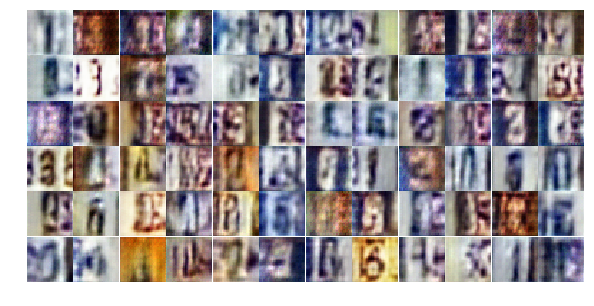

Epoch 6/25... Discriminator Loss: 0.7980... Generator Loss: 0.8234
Epoch 6/25... Discriminator Loss: 0.4911... Generator Loss: 2.1750
Epoch 6/25... Discriminator Loss: 0.5640... Generator Loss: 1.5775
Epoch 6/25... Discriminator Loss: 1.0138... Generator Loss: 0.6312
Epoch 6/25... Discriminator Loss: 0.9338... Generator Loss: 0.6883
Epoch 6/25... Discriminator Loss: 0.4627... Generator Loss: 1.6141
Epoch 6/25... Discriminator Loss: 0.5830... Generator Loss: 1.9999
Epoch 6/25... Discriminator Loss: 0.9604... Generator Loss: 0.6888
Epoch 6/25... Discriminator Loss: 0.8898... Generator Loss: 0.7010
Epoch 6/25... Discriminator Loss: 0.6473... Generator Loss: 1.3436


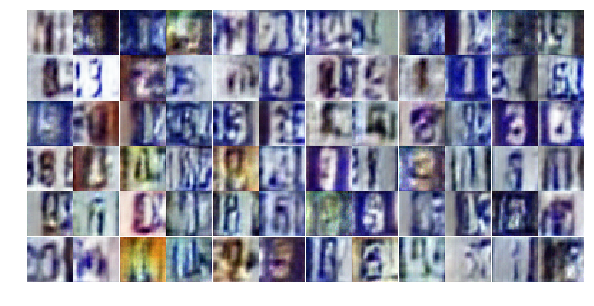

Epoch 6/25... Discriminator Loss: 0.4277... Generator Loss: 1.5313
Epoch 6/25... Discriminator Loss: 0.6758... Generator Loss: 1.0626
Epoch 6/25... Discriminator Loss: 0.7599... Generator Loss: 1.2152
Epoch 6/25... Discriminator Loss: 0.3586... Generator Loss: 1.6432
Epoch 6/25... Discriminator Loss: 0.5162... Generator Loss: 2.0943
Epoch 6/25... Discriminator Loss: 0.5637... Generator Loss: 1.1693
Epoch 6/25... Discriminator Loss: 0.5827... Generator Loss: 1.5087
Epoch 6/25... Discriminator Loss: 0.7593... Generator Loss: 0.8661
Epoch 6/25... Discriminator Loss: 1.9902... Generator Loss: 3.8169
Epoch 6/25... Discriminator Loss: 0.9561... Generator Loss: 1.1228


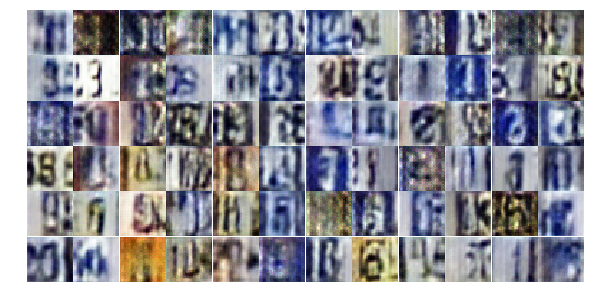

Epoch 6/25... Discriminator Loss: 1.3419... Generator Loss: 0.5504
Epoch 6/25... Discriminator Loss: 0.8738... Generator Loss: 1.7193
Epoch 6/25... Discriminator Loss: 0.8175... Generator Loss: 0.8732
Epoch 6/25... Discriminator Loss: 0.6530... Generator Loss: 1.1868
Epoch 6/25... Discriminator Loss: 0.4363... Generator Loss: 1.6982
Epoch 6/25... Discriminator Loss: 1.2053... Generator Loss: 0.4790
Epoch 6/25... Discriminator Loss: 0.5522... Generator Loss: 1.9924
Epoch 6/25... Discriminator Loss: 0.4352... Generator Loss: 1.6737
Epoch 6/25... Discriminator Loss: 0.4654... Generator Loss: 1.5422
Epoch 6/25... Discriminator Loss: 0.4448... Generator Loss: 1.6894


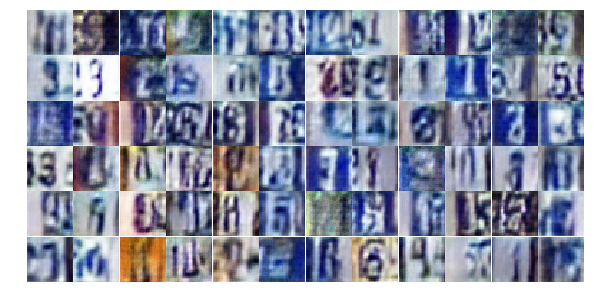

Epoch 6/25... Discriminator Loss: 0.9710... Generator Loss: 0.8266
Epoch 6/25... Discriminator Loss: 1.0726... Generator Loss: 2.7272
Epoch 6/25... Discriminator Loss: 0.9526... Generator Loss: 0.7780
Epoch 6/25... Discriminator Loss: 0.4305... Generator Loss: 1.5005
Epoch 6/25... Discriminator Loss: 0.9669... Generator Loss: 0.7210
Epoch 6/25... Discriminator Loss: 0.5991... Generator Loss: 1.4182
Epoch 6/25... Discriminator Loss: 0.5075... Generator Loss: 1.6301
Epoch 6/25... Discriminator Loss: 0.4105... Generator Loss: 2.0499
Epoch 6/25... Discriminator Loss: 0.8472... Generator Loss: 0.7923
Epoch 6/25... Discriminator Loss: 0.5473... Generator Loss: 1.1613


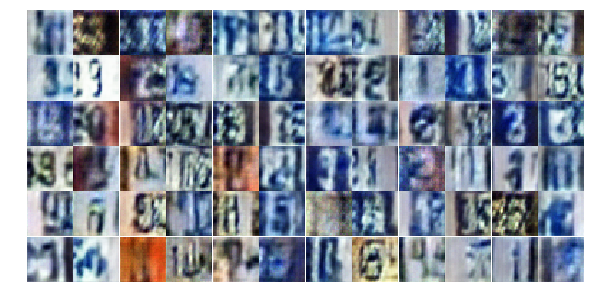

Epoch 6/25... Discriminator Loss: 0.5346... Generator Loss: 1.3861
Epoch 6/25... Discriminator Loss: 1.4650... Generator Loss: 0.4169
Epoch 6/25... Discriminator Loss: 1.2747... Generator Loss: 0.4176
Epoch 6/25... Discriminator Loss: 0.9108... Generator Loss: 0.8833
Epoch 6/25... Discriminator Loss: 0.4306... Generator Loss: 1.9897
Epoch 6/25... Discriminator Loss: 0.7373... Generator Loss: 0.8682
Epoch 6/25... Discriminator Loss: 0.8103... Generator Loss: 0.8707
Epoch 6/25... Discriminator Loss: 1.1202... Generator Loss: 0.5220
Epoch 6/25... Discriminator Loss: 0.4475... Generator Loss: 1.4839
Epoch 6/25... Discriminator Loss: 1.5095... Generator Loss: 0.3485


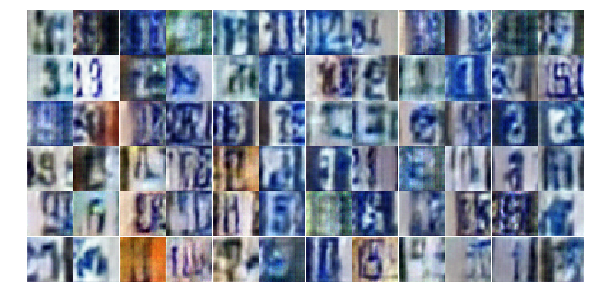

Epoch 6/25... Discriminator Loss: 0.6471... Generator Loss: 1.6167
Epoch 6/25... Discriminator Loss: 0.5437... Generator Loss: 1.3988
Epoch 6/25... Discriminator Loss: 0.6698... Generator Loss: 1.8181
Epoch 7/25... Discriminator Loss: 0.6649... Generator Loss: 1.3938
Epoch 7/25... Discriminator Loss: 0.5718... Generator Loss: 1.3139
Epoch 7/25... Discriminator Loss: 0.6721... Generator Loss: 1.0485
Epoch 7/25... Discriminator Loss: 0.5305... Generator Loss: 1.2659
Epoch 7/25... Discriminator Loss: 0.3803... Generator Loss: 1.6911
Epoch 7/25... Discriminator Loss: 0.5736... Generator Loss: 1.3970
Epoch 7/25... Discriminator Loss: 0.9099... Generator Loss: 0.6759


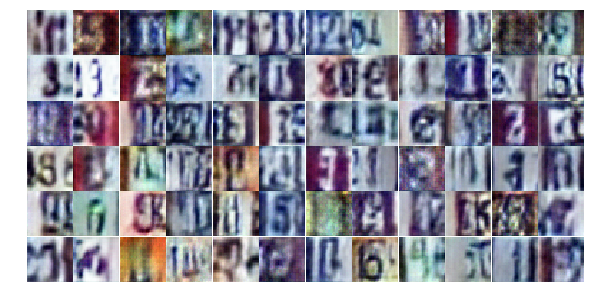

Epoch 7/25... Discriminator Loss: 1.5566... Generator Loss: 4.3197
Epoch 7/25... Discriminator Loss: 1.0104... Generator Loss: 1.2810
Epoch 7/25... Discriminator Loss: 0.6990... Generator Loss: 1.2155
Epoch 7/25... Discriminator Loss: 0.6021... Generator Loss: 1.6487
Epoch 7/25... Discriminator Loss: 0.5765... Generator Loss: 1.1718
Epoch 7/25... Discriminator Loss: 0.4815... Generator Loss: 1.5260
Epoch 7/25... Discriminator Loss: 0.7961... Generator Loss: 1.6312
Epoch 7/25... Discriminator Loss: 0.6532... Generator Loss: 1.8505
Epoch 7/25... Discriminator Loss: 0.5576... Generator Loss: 2.1136
Epoch 7/25... Discriminator Loss: 0.6478... Generator Loss: 1.1658


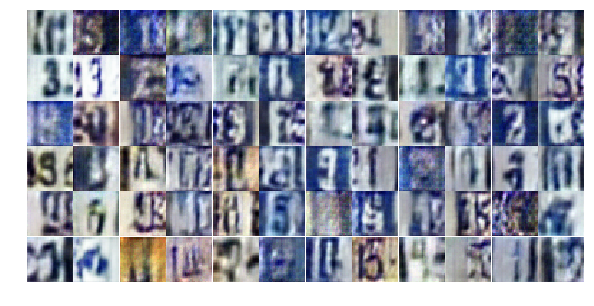

Epoch 7/25... Discriminator Loss: 0.5877... Generator Loss: 1.3050
Epoch 7/25... Discriminator Loss: 0.4696... Generator Loss: 1.6188
Epoch 7/25... Discriminator Loss: 1.1830... Generator Loss: 0.5145
Epoch 7/25... Discriminator Loss: 0.6049... Generator Loss: 1.2076
Epoch 7/25... Discriminator Loss: 0.4929... Generator Loss: 1.7915
Epoch 7/25... Discriminator Loss: 0.4859... Generator Loss: 1.3740
Epoch 7/25... Discriminator Loss: 0.5444... Generator Loss: 1.2903
Epoch 7/25... Discriminator Loss: 1.0556... Generator Loss: 0.6445
Epoch 7/25... Discriminator Loss: 0.3380... Generator Loss: 2.0525
Epoch 7/25... Discriminator Loss: 0.4057... Generator Loss: 2.3008


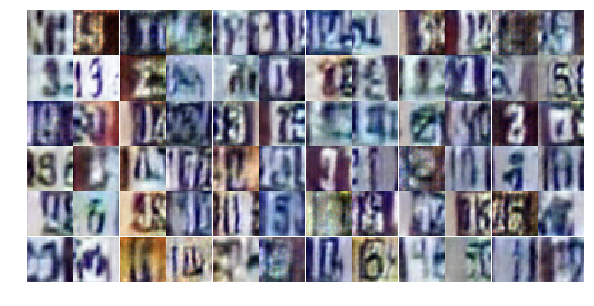

Epoch 7/25... Discriminator Loss: 0.7966... Generator Loss: 0.8113
Epoch 7/25... Discriminator Loss: 1.4738... Generator Loss: 0.4154
Epoch 7/25... Discriminator Loss: 0.6819... Generator Loss: 1.0360
Epoch 7/25... Discriminator Loss: 1.0936... Generator Loss: 0.5466
Epoch 7/25... Discriminator Loss: 0.7247... Generator Loss: 0.9272
Epoch 7/25... Discriminator Loss: 0.8043... Generator Loss: 0.8359
Epoch 7/25... Discriminator Loss: 0.3819... Generator Loss: 1.7047
Epoch 7/25... Discriminator Loss: 0.4483... Generator Loss: 1.6717
Epoch 7/25... Discriminator Loss: 0.8912... Generator Loss: 0.8983
Epoch 7/25... Discriminator Loss: 0.7622... Generator Loss: 2.4935


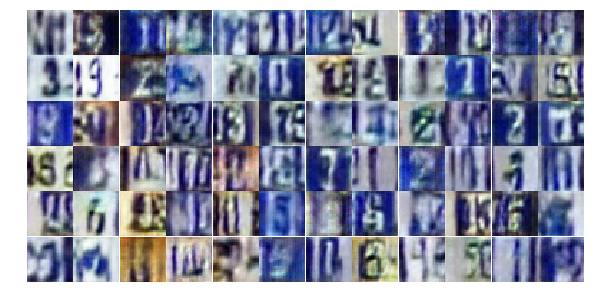

Epoch 7/25... Discriminator Loss: 1.1693... Generator Loss: 0.5503
Epoch 7/25... Discriminator Loss: 0.5966... Generator Loss: 1.1879
Epoch 7/25... Discriminator Loss: 0.3125... Generator Loss: 2.0240
Epoch 7/25... Discriminator Loss: 0.5032... Generator Loss: 1.4401
Epoch 7/25... Discriminator Loss: 0.6079... Generator Loss: 1.2986
Epoch 7/25... Discriminator Loss: 0.4630... Generator Loss: 1.4346
Epoch 7/25... Discriminator Loss: 0.6624... Generator Loss: 1.0170
Epoch 7/25... Discriminator Loss: 1.0033... Generator Loss: 1.1657
Epoch 7/25... Discriminator Loss: 0.9972... Generator Loss: 2.8539
Epoch 7/25... Discriminator Loss: 0.7268... Generator Loss: 1.6643


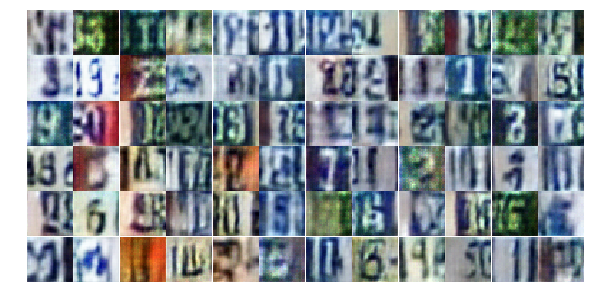

Epoch 7/25... Discriminator Loss: 0.2497... Generator Loss: 1.8965
Epoch 7/25... Discriminator Loss: 0.5502... Generator Loss: 1.2415
Epoch 7/25... Discriminator Loss: 0.7892... Generator Loss: 1.8196
Epoch 7/25... Discriminator Loss: 0.9992... Generator Loss: 0.6231
Epoch 7/25... Discriminator Loss: 0.4609... Generator Loss: 1.7236
Epoch 7/25... Discriminator Loss: 0.6363... Generator Loss: 1.8790
Epoch 7/25... Discriminator Loss: 1.4043... Generator Loss: 0.3990
Epoch 7/25... Discriminator Loss: 0.7311... Generator Loss: 1.5666
Epoch 7/25... Discriminator Loss: 0.9498... Generator Loss: 0.6747
Epoch 7/25... Discriminator Loss: 0.4915... Generator Loss: 1.2762


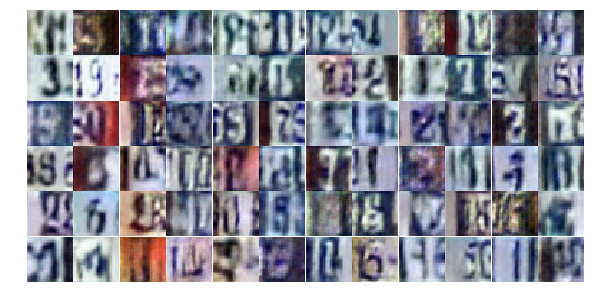

Epoch 7/25... Discriminator Loss: 0.5040... Generator Loss: 2.1745
Epoch 8/25... Discriminator Loss: 0.5744... Generator Loss: 1.0804
Epoch 8/25... Discriminator Loss: 0.7437... Generator Loss: 0.8397
Epoch 8/25... Discriminator Loss: 0.5876... Generator Loss: 1.1722
Epoch 8/25... Discriminator Loss: 0.4548... Generator Loss: 2.0482
Epoch 8/25... Discriminator Loss: 0.5603... Generator Loss: 1.2192
Epoch 8/25... Discriminator Loss: 1.0260... Generator Loss: 0.6251
Epoch 8/25... Discriminator Loss: 0.3549... Generator Loss: 1.8071
Epoch 8/25... Discriminator Loss: 0.6609... Generator Loss: 1.1306
Epoch 8/25... Discriminator Loss: 0.7015... Generator Loss: 0.9331


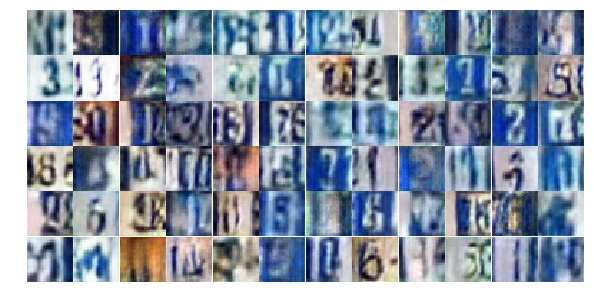

Epoch 8/25... Discriminator Loss: 0.3906... Generator Loss: 1.9053
Epoch 8/25... Discriminator Loss: 0.8102... Generator Loss: 2.8759
Epoch 8/25... Discriminator Loss: 1.4465... Generator Loss: 0.4914
Epoch 8/25... Discriminator Loss: 0.3111... Generator Loss: 2.0927
Epoch 8/25... Discriminator Loss: 0.8801... Generator Loss: 0.8013
Epoch 8/25... Discriminator Loss: 0.7823... Generator Loss: 2.6615
Epoch 8/25... Discriminator Loss: 0.6926... Generator Loss: 0.9850
Epoch 8/25... Discriminator Loss: 0.5853... Generator Loss: 1.8004
Epoch 8/25... Discriminator Loss: 0.8413... Generator Loss: 0.8251
Epoch 8/25... Discriminator Loss: 1.0050... Generator Loss: 0.6614


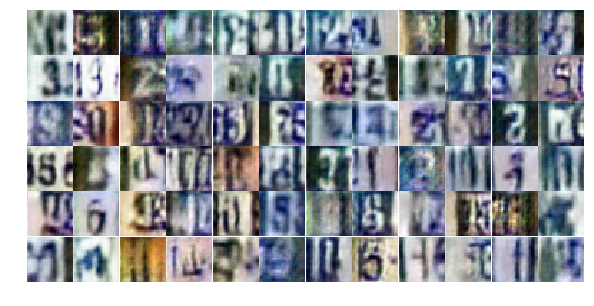

Epoch 8/25... Discriminator Loss: 0.3924... Generator Loss: 2.3481
Epoch 8/25... Discriminator Loss: 0.4968... Generator Loss: 1.3660
Epoch 8/25... Discriminator Loss: 0.4667... Generator Loss: 1.5898
Epoch 8/25... Discriminator Loss: 0.9730... Generator Loss: 0.6462
Epoch 8/25... Discriminator Loss: 0.5434... Generator Loss: 1.2263
Epoch 8/25... Discriminator Loss: 0.8163... Generator Loss: 1.9712
Epoch 8/25... Discriminator Loss: 0.6757... Generator Loss: 1.1670
Epoch 8/25... Discriminator Loss: 0.4677... Generator Loss: 1.4101
Epoch 8/25... Discriminator Loss: 0.6978... Generator Loss: 1.7608
Epoch 8/25... Discriminator Loss: 0.8888... Generator Loss: 0.7846


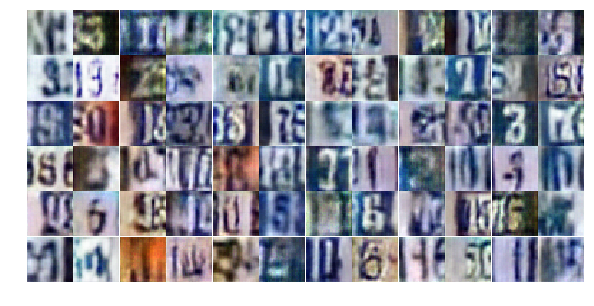

Epoch 8/25... Discriminator Loss: 0.6693... Generator Loss: 2.0623
Epoch 8/25... Discriminator Loss: 1.0558... Generator Loss: 0.5826
Epoch 8/25... Discriminator Loss: 0.8019... Generator Loss: 0.9653
Epoch 8/25... Discriminator Loss: 0.9342... Generator Loss: 0.6985
Epoch 8/25... Discriminator Loss: 1.2602... Generator Loss: 0.5107
Epoch 8/25... Discriminator Loss: 0.6074... Generator Loss: 1.1953
Epoch 8/25... Discriminator Loss: 0.5987... Generator Loss: 1.2739
Epoch 8/25... Discriminator Loss: 0.6725... Generator Loss: 1.1596
Epoch 8/25... Discriminator Loss: 0.6193... Generator Loss: 1.0757
Epoch 8/25... Discriminator Loss: 0.4663... Generator Loss: 1.7189


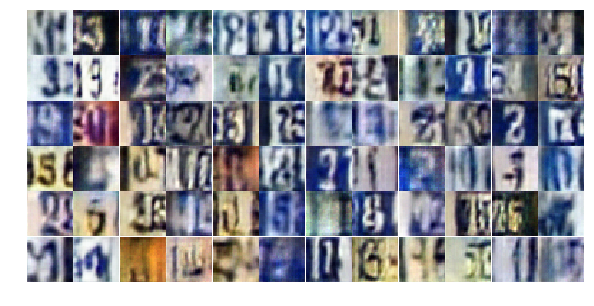

Epoch 8/25... Discriminator Loss: 0.4508... Generator Loss: 1.5118
Epoch 8/25... Discriminator Loss: 0.9512... Generator Loss: 0.6862
Epoch 8/25... Discriminator Loss: 0.3792... Generator Loss: 1.5242
Epoch 8/25... Discriminator Loss: 0.6153... Generator Loss: 1.1167
Epoch 8/25... Discriminator Loss: 0.7123... Generator Loss: 1.8176
Epoch 8/25... Discriminator Loss: 0.9610... Generator Loss: 0.6738
Epoch 8/25... Discriminator Loss: 0.5796... Generator Loss: 1.1303
Epoch 8/25... Discriminator Loss: 0.5778... Generator Loss: 2.5525
Epoch 8/25... Discriminator Loss: 0.4560... Generator Loss: 1.7477
Epoch 8/25... Discriminator Loss: 0.6763... Generator Loss: 1.4864


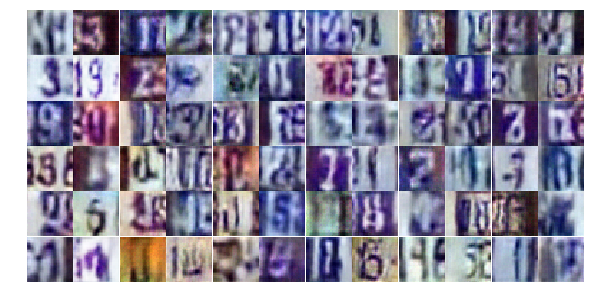

Epoch 8/25... Discriminator Loss: 0.8213... Generator Loss: 0.8129
Epoch 8/25... Discriminator Loss: 0.4016... Generator Loss: 1.7348
Epoch 8/25... Discriminator Loss: 0.6686... Generator Loss: 2.3300
Epoch 8/25... Discriminator Loss: 0.9169... Generator Loss: 0.6637
Epoch 8/25... Discriminator Loss: 0.6091... Generator Loss: 2.7435
Epoch 8/25... Discriminator Loss: 0.8334... Generator Loss: 1.0153
Epoch 8/25... Discriminator Loss: 0.5658... Generator Loss: 1.1708
Epoch 8/25... Discriminator Loss: 0.4524... Generator Loss: 1.8074
Epoch 9/25... Discriminator Loss: 0.7507... Generator Loss: 1.3263
Epoch 9/25... Discriminator Loss: 0.6061... Generator Loss: 1.0563


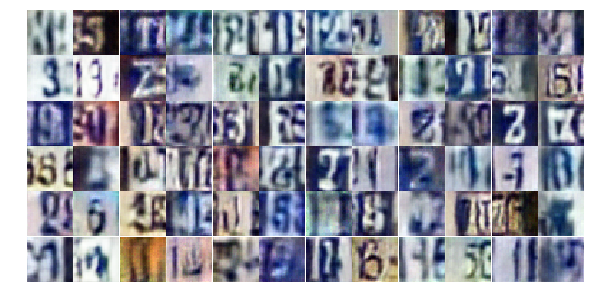

Epoch 9/25... Discriminator Loss: 0.7962... Generator Loss: 0.9091
Epoch 9/25... Discriminator Loss: 0.4259... Generator Loss: 1.6792
Epoch 9/25... Discriminator Loss: 1.5576... Generator Loss: 3.5425
Epoch 9/25... Discriminator Loss: 0.6859... Generator Loss: 1.0640
Epoch 9/25... Discriminator Loss: 0.6984... Generator Loss: 0.9506
Epoch 9/25... Discriminator Loss: 0.5754... Generator Loss: 2.3171
Epoch 9/25... Discriminator Loss: 0.6166... Generator Loss: 1.6581
Epoch 9/25... Discriminator Loss: 0.4897... Generator Loss: 1.3003
Epoch 9/25... Discriminator Loss: 0.9198... Generator Loss: 0.6721
Epoch 9/25... Discriminator Loss: 0.5104... Generator Loss: 1.8704


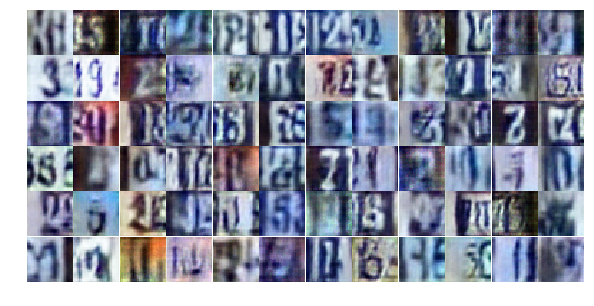

Epoch 9/25... Discriminator Loss: 0.7984... Generator Loss: 0.7787
Epoch 9/25... Discriminator Loss: 2.2204... Generator Loss: 0.1659
Epoch 9/25... Discriminator Loss: 1.1529... Generator Loss: 0.5626
Epoch 9/25... Discriminator Loss: 0.5735... Generator Loss: 1.2953
Epoch 9/25... Discriminator Loss: 0.7241... Generator Loss: 0.9405
Epoch 9/25... Discriminator Loss: 0.8699... Generator Loss: 0.8471
Epoch 9/25... Discriminator Loss: 0.8732... Generator Loss: 0.8734
Epoch 9/25... Discriminator Loss: 0.5985... Generator Loss: 1.0793
Epoch 9/25... Discriminator Loss: 1.0736... Generator Loss: 0.6120
Epoch 9/25... Discriminator Loss: 0.7409... Generator Loss: 0.8670


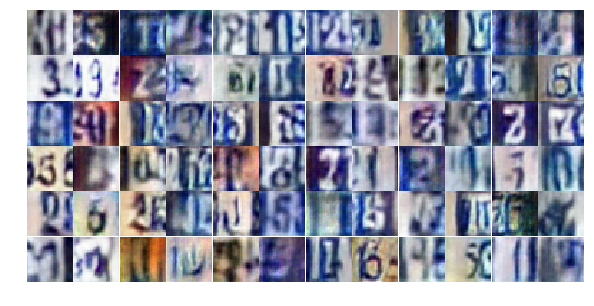

Epoch 9/25... Discriminator Loss: 0.8027... Generator Loss: 0.8672
Epoch 9/25... Discriminator Loss: 0.6069... Generator Loss: 2.0153
Epoch 9/25... Discriminator Loss: 0.4238... Generator Loss: 1.8343
Epoch 9/25... Discriminator Loss: 0.6714... Generator Loss: 1.0474
Epoch 9/25... Discriminator Loss: 0.4808... Generator Loss: 1.5315
Epoch 9/25... Discriminator Loss: 0.4908... Generator Loss: 1.4398
Epoch 9/25... Discriminator Loss: 1.8798... Generator Loss: 0.2340
Epoch 9/25... Discriminator Loss: 0.5791... Generator Loss: 1.1896
Epoch 9/25... Discriminator Loss: 0.4829... Generator Loss: 1.3724
Epoch 9/25... Discriminator Loss: 0.5702... Generator Loss: 1.1310


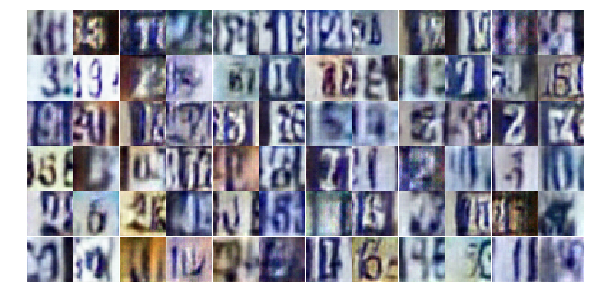

Epoch 9/25... Discriminator Loss: 0.3974... Generator Loss: 1.5744
Epoch 9/25... Discriminator Loss: 0.4593... Generator Loss: 1.3660
Epoch 9/25... Discriminator Loss: 0.7193... Generator Loss: 1.1440
Epoch 9/25... Discriminator Loss: 0.7609... Generator Loss: 2.1943
Epoch 9/25... Discriminator Loss: 0.4873... Generator Loss: 1.6899
Epoch 9/25... Discriminator Loss: 0.7313... Generator Loss: 1.0630
Epoch 9/25... Discriminator Loss: 0.5107... Generator Loss: 1.3539
Epoch 9/25... Discriminator Loss: 0.3932... Generator Loss: 1.9009
Epoch 9/25... Discriminator Loss: 1.0274... Generator Loss: 0.6240
Epoch 9/25... Discriminator Loss: 0.9687... Generator Loss: 0.7145


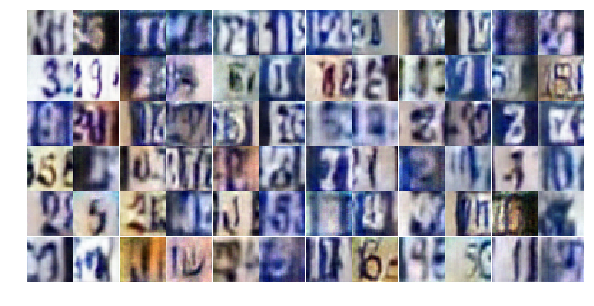

Epoch 9/25... Discriminator Loss: 0.4327... Generator Loss: 1.7260
Epoch 9/25... Discriminator Loss: 1.0850... Generator Loss: 0.6039
Epoch 9/25... Discriminator Loss: 2.7004... Generator Loss: 0.1415
Epoch 9/25... Discriminator Loss: 0.9498... Generator Loss: 1.9722
Epoch 9/25... Discriminator Loss: 0.7209... Generator Loss: 1.2222
Epoch 9/25... Discriminator Loss: 0.6104... Generator Loss: 1.2698
Epoch 9/25... Discriminator Loss: 0.5639... Generator Loss: 1.3696
Epoch 9/25... Discriminator Loss: 0.7555... Generator Loss: 0.9344
Epoch 9/25... Discriminator Loss: 0.5069... Generator Loss: 1.6513
Epoch 9/25... Discriminator Loss: 0.4649... Generator Loss: 2.2555


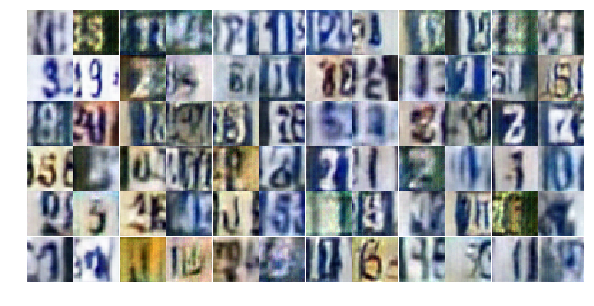

Epoch 9/25... Discriminator Loss: 0.8869... Generator Loss: 0.7341
Epoch 9/25... Discriminator Loss: 0.7093... Generator Loss: 3.3261
Epoch 9/25... Discriminator Loss: 0.6335... Generator Loss: 1.1455
Epoch 9/25... Discriminator Loss: 1.2629... Generator Loss: 0.4143


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))